# **1- Import Dataset**

In [62]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from IPython.display import display
from folium.plugins import HeatMap

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



/kaggle/input/turkiye-deprem-verileri/data.csv


In [40]:

df = pd.read_csv('/kaggle/input/turkiye-deprem-verileri/data.csv')

In [41]:

df_backup = df.copy()

In [42]:
df_backup.head()

,Date,Longitude,Latitude,Depth,Rms,Type,Magnitude,Location,EventID
0,27/04/2025 18:46:18,38.9378,38.3686,7.00,0.34,ML,2.2,Sivrice (Elazığ),659072
1,27/04/2025 18:44:45,38.8917,38.3883,7.42,0.25,ML,1.9,Sivrice (Elazığ),659071
2,27/04/2025 18:42:18,39.5172,38.5908,7.00,0.28,ML,1.1,Merkez (Elazığ),659070
3,27/04/2025 18:36:01,28.4603,40.8469,7.00,0.49,ML,1.6,Marmara Denizi - [17.61 km] Büyükçekmece (İsta...,659068
4,27/04/2025 18:35:21,38.9064,38.4014,7.00,0.36,ML,1.7,Sivrice (Elazığ),659069


In [43]:
df_backup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 493153 entries, 0 to 493152
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date       493153 non-null  object 
 1   Longitude  493153 non-null  float64
 2   Latitude   493153 non-null  float64
 3   Depth      493153 non-null  float64
 4   Rms        493153 non-null  float64
 5   Type       493153 non-null  object 
 6   Magnitude  493153 non-null  float64
 7   Location   493153 non-null  object 
 8   EventID    493153 non-null  int64  
dtypes: float64(5), int64(1), object(3)
memory usage: 33.9+ MB



> Verisetinde; **Tarih**, **Enlem**, **Boylam**, **Derinlik**, **Tip**, **Büyüklük**, **Yer**,  **EventID** bulunuyor.


# **2- Missing Data Analysis**

In [44]:
df_backup.isna().sum()

Date         0
Longitude    0
Latitude     0
Depth        0
Rms          0
Type         0
Magnitude    0
Location     0
EventID      0
dtype: int64

> Verisetimde eksik veri yok. "Date" sütununu datetime'a, "Type" ve "Location" sütunlarını ise kategorik veri tipine dönüştürerek, veriyle zaman bazlı analizler yapmamı ve kategorik değişkenleri daha verimli ve hızlı bir şekilde işlememi sağladım.

In [45]:
df_backup['Date'] = pd.to_datetime(df_backup['Date'])

df_backup['Type'] = df_backup['Type'].astype('category')
df_backup['Location'] = df_backup['Location'].astype('category')

df_backup.dtypes


/tmp/ipykernel_31/2383178548.py:1: UserWarning:

Parsing dates in %d/%m/%Y %H:%M:%S format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



Date         datetime64[ns]
Longitude           float64
Latitude            float64
Depth               float64
Rms                 float64
Type               category
Magnitude           float64
Location           category
EventID               int64
dtype: object

# **3- Visualization**

In [64]:


#  Her bölgeye ve deprem tipine göre deprem sayısı tablosu (DataFrame)
location_type_counts = df_backup.groupby(['Location','Type']).size().unstack(fill_value=0)

#  Toplamlarına göre en büyük 20 bölgeyi bul
top20_locations = location_type_counts.sum(axis=1).sort_values(ascending=False).head(20)

#  Sadece bu bölgeleri seç
top20_data = location_type_counts.loc[top20_locations.index]

# Bar plot (barmode='stack')
fig = px.bar(
    top20_data.reset_index(),
    x='Location',
    y=top20_data.columns,
    title='İlk 20 Bölgeye Göre Türlere Ayrılmış Deprem Sayısı',
    labels={'value': 'Deprem Sayısı', 'Location': 'Bölge'},
    barmode='stack'
)

fig.update_layout(xaxis={'categoryorder': 'total descending'}, height=600, width=1000)
fig.show()

/tmp/ipykernel_31/2280157332.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.




 > * **ML (Local Magnitude):**
Yerel Büyüklük. "Richter ölçeği" olarak da bilinir. Genellikle yakınlarda ölçülen küçük-orta büyüklükteki depremler için kullanılır.

 > * **MW (Moment Magnitude):**
Moment Büyüklük. Büyük depremler için daha güvenilir ve günümüzde en yaygın kullanılan büyüklük ölçeğidir. Enerjiye ve faydaki kaymaya dayanır.

 > * **Md (Duration Magnitude):**
Süreye Bağlı Büyüklük. Deprem dalgalarının süresine göre hesaplanır.

 > * **Ml (veya mL) (Local Magnitude):**
Yukarıda belirtilen ML ile aynıdır, yazım farkıdır (bazı yerlerde küçük harfle de yazılabilir).

 > * **Mw (Moment Magnitude):**
"MW" ile aynıdır; yazım farkıdır (bazı veritabanlarında küçük harfle geçer). Yani Moment büyüklüğünü gösterir.

 > * **MI (Intensity Magnitude):**
Bazen Intensity Magnitude veya Body-wave Magnitude (Mb) anlamına gelebilir. Bazı sismoloji kaynaklarında Intensity (Şiddet) olarak da geçebilir.

 > * **Mwp (Moment Magnitude, P-wave):**
P dalgası ile hesaplanan moment büyüklüğü. Tsunami erken uyarı sistemlerinde kullanılır.

<div style="border: 1px solid #36648b; padding: 10px; background-color: #36648b;">
Bu grafik, Türkiye’de 1999-2024 yılları arasında en fazla depremin kaydedildiği ilk 20 bölgede gerçekleşen depremlerin, büyüklük ölçüm tiplerine göre (ML, MW, Md, MI, Mw, Mwp) sayısını göstermektedir.
Her barın rengi, ilgili büyüklük tipini temsil eder; bu sayede hem bölgesel deprem yoğunluğu hem de hangi büyüklük yönteminin o bölgede daha sık kullanıldığı kolayca görülmektedir.
</div>


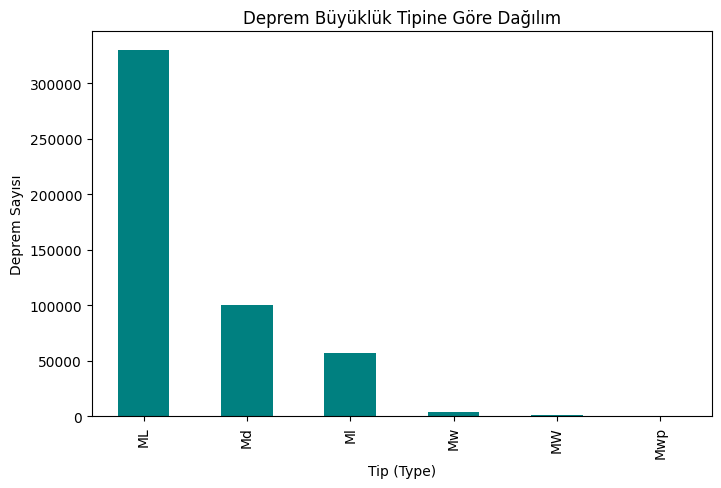

In [47]:
plt.figure(figsize=(8,5))
df_backup['Type'].value_counts().plot(kind='bar', color='teal')
plt.title('Deprem Büyüklük Tipine Göre Dağılım')
plt.xlabel('Tip (Type)')
plt.ylabel('Deprem Sayısı')
plt.show()

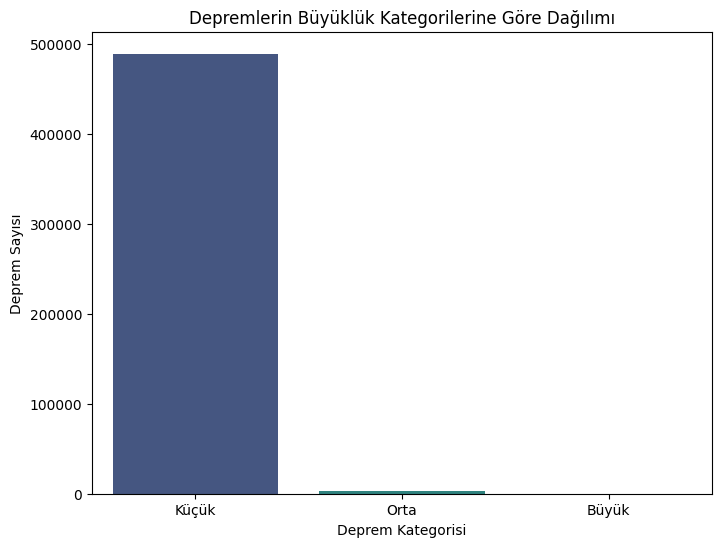

In [48]:
# Depremleri büyüklüğe göre kategorilere ayıralım
def magnitude_category(mag):
    if mag < 4.0:
        return 'Küçük'
    elif 4.0 <= mag < 6.0:
        return 'Orta'
    else:
        return 'Büyük'

# Yeni sütun 
df_backup['Mag_Category'] = df_backup['Magnitude'].apply(magnitude_category)


plt.figure(figsize=(8,6))
sns.countplot(data=df_backup, x='Mag_Category', palette='viridis', order=['Küçük', 'Orta', 'Büyük'])
plt.title('Depremlerin Büyüklük Kategorilerine Göre Dağılımı')
plt.xlabel('Deprem Kategorisi')
plt.ylabel('Deprem Sayısı')
plt.show()


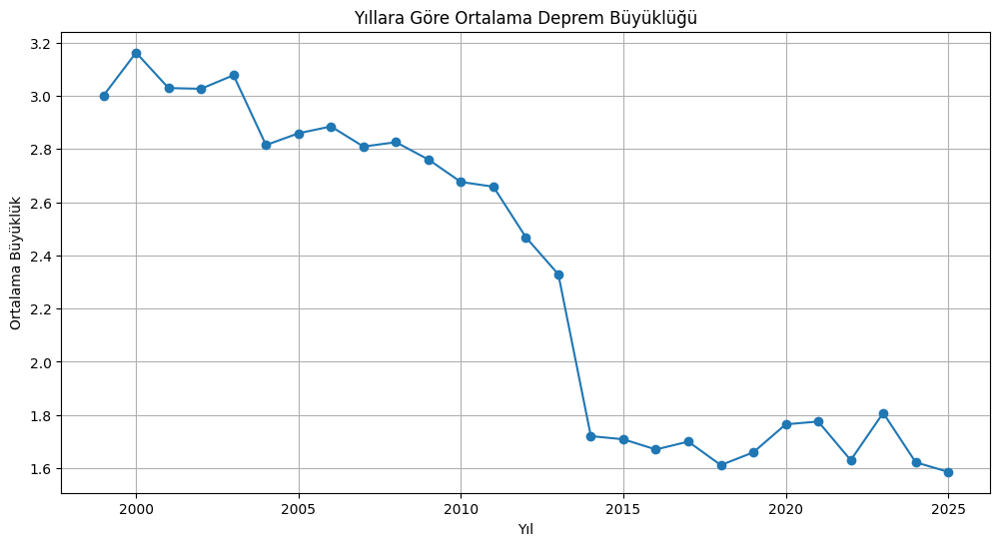

In [49]:
# Yıl bilgisini çıkar
df_backup['Year'] = df_backup['Date'].dt.year

# Yıla göre ortalama büyüklük
yearly_magnitude = df_backup.groupby('Year')['Magnitude'].mean()

plt.figure(figsize=(12,6))
yearly_magnitude.plot(marker='o')
plt.title('Yıllara Göre Ortalama Deprem Büyüklüğü')
plt.xlabel('Yıl')
plt.ylabel('Ortalama Büyüklük')
plt.grid(True)
plt.show()


 
<div style="border: 1px solid #36648b; padding: 10px; background-color: #36648b;">
Grafikte, Türkiye’de yıllara göre ortalama deprem büyüklüğündeki değişim izlenmektedir. 1999-2013 yılları arasında ortalama büyüklük 2.8-3.2 aralığında seyrederken, 2014 yılından itibaren belirgin bir düşüş yaşanmış ve bu tarihten sonra ortalama büyüklük 1.6-1.8 civarında kalmıştır. 
</div>

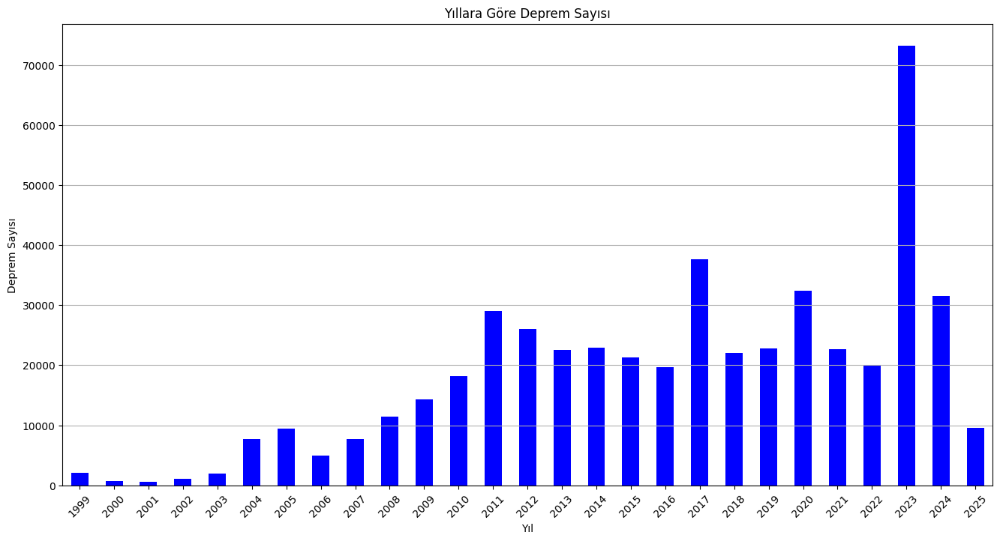

In [50]:
# Yıl bilgisini çıkar
df_backup['Year'] = df_backup['Date'].dt.year

# Yıllara göre deprem sayısını bul
yearly_earthquake_counts = df_backup['Year'].value_counts().sort_index()

# Sonucu çizdirelim
plt.figure(figsize=(16,8))
yearly_earthquake_counts.plot(kind='bar', color='blue')
plt.title('Yıllara Göre Deprem Sayısı')
plt.xlabel('Yıl')
plt.ylabel('Deprem Sayısı')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()



In [51]:
# Türkiye merkezli bir boş harita oluştur, başlangıç konumu (enlem 39.0, boylam 35.0), başlangıç yakınlaştırma seviyesi 6
harita = folium.Map(location=[39.0, 35.0], zoom_start=6)

# Deprem verilerinde büyüklüğü 5 ve üzerinde olan her bir deprem için döngü başlatıyorum
for _, row in df_backup[df_backup['Magnitude'] >= 5].iterrows():
    # Her deprem için, haritada kırmızı bir dairesel işaret (marker) oluştur
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']], # Depremin gerçekleştiği enlem ve boylam (konum)
        radius=3 + (row['Magnitude'] - 4) * 2,  # Dairenin boyutu; büyüklük arttıkça daire büyür (örn. M5 için 5, M6 için 7)
        color='orange', # Dairenin dış çizgisi
        fill=True, # Daire içi doldurulsun mu? True
        fill_color='orange', # Dairenin iç rengi
        popup=f"{row['Location']} | {row['Magnitude']} | {row['Date']}"  # Daireye tıklandığında çıkan kutudaki yazı: Konum ve büyüklük
    ).add_to(harita) # Oluşturulan işareti haritaya ekle
display(harita)

In [52]:
m = folium.Map(location=[39, 35], zoom_start=6)
heat_data = [[row['Latitude'], row['Longitude']] for index, row in df_backup.iterrows()]
HeatMap(heat_data, radius=7, blur=4).add_to(m)
display(m)

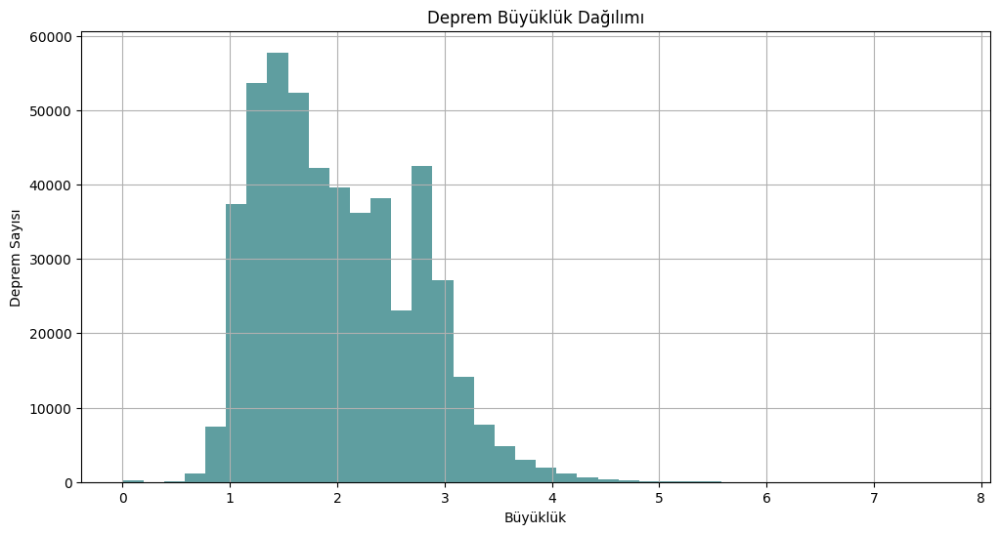

In [53]:
plt.figure(figsize=(12,6))
df_backup['Magnitude'].hist(bins=40, color='cadetblue')
plt.title('Deprem Büyüklük Dağılımı')
plt.xlabel('Büyüklük')
plt.ylabel('Deprem Sayısı')
plt.show()

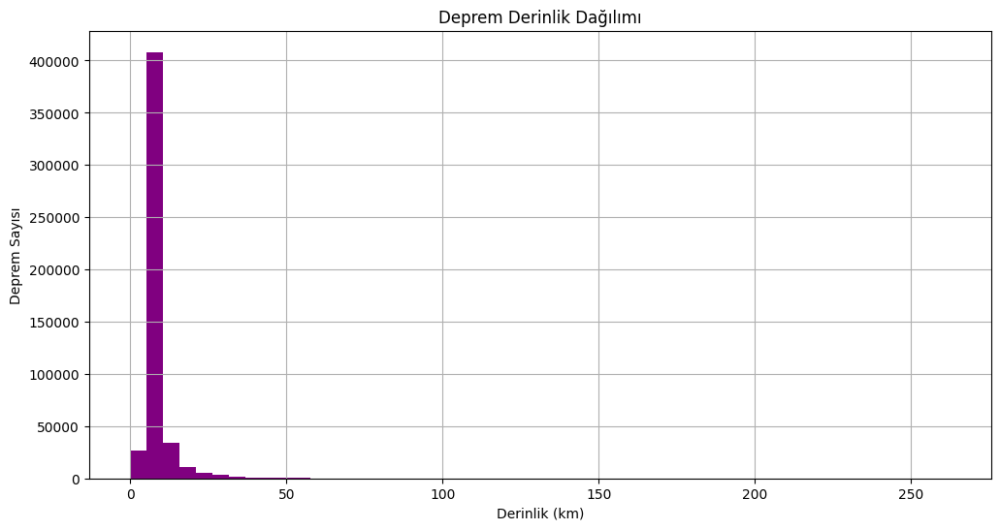

In [54]:
plt.figure(figsize=(12,6))
df_backup['Depth'].hist(bins=50, color='purple')
plt.title('Deprem Derinlik Dağılımı')
plt.xlabel('Derinlik (km)')
plt.ylabel('Deprem Sayısı')
plt.show()

## **4- Prediction**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Type'ı sayısala çevir (label encoding)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(df_backup['Type'])

X = df_backup[['Longitude', 'Latitude', 'Depth', 'Magnitude']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", 
      classification_report(y_test, y_pred, labels=np.unique(y_test), target_names=le.inverse_transform(np.unique(y_test))))